<a href="https://colab.research.google.com/github/pastoril10/COVID19/blob/main/COVID19.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import plotly.offline as py
import plotly.graph_objs as go
import plotly.express as px

## Importando os dados CSV

In [2]:
#importando os dados de pessoas confirmadas com COVID
df_confirmados = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')

In [3]:
#importando os dados de pessoas mortas por Covid
df_mortos = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')

In [4]:
#importando os ultimos dados
ultimos_dados = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports/11-14-2021.csv')

In [5]:
#Casos confirmados, mortes confirmadas etc até a data atual
df_covid19 = pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/web-data/data/cases_country.csv")             

In [6]:
#Casos confirmados até a data atual por região
df_table = pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/web-data/data/cases_time.csv",parse_dates=['Last_Update'])   

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: DtypeWarning:

Columns (11) have mixed types.Specify dtype option on import or set low_memory=False.



In [7]:
df_covid19.head()

,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,UID,ISO3,Cases_28_Days,Deaths_28_Days
0,Afghanistan,2022-02-01 18:21:07,33.93911,67.709953,163555,7417,NaN,NaN,420.143771,NaN,NaN,4.534866,4,AFG,4743,50
1,Albania,2022-02-01 18:21:07,41.15330,20.168300,258543,3346,NaN,NaN,8984.050316,NaN,NaN,1.294175,8,ALB,47658,126
2,Algeria,2022-02-01 18:21:07,28.03390,1.659600,252117,6579,NaN,NaN,574.939574,NaN,NaN,2.609503,12,DZA,32585,281
3,Andorra,2022-02-01 18:21:07,42.50630,1.521800,35958,145,NaN,NaN,46538.536207,NaN,NaN,0.403248,20,AND,11456,5
4,Angola,2022-02-01 18:21:07,-11.20270,17.873900,98116,1895,NaN,NaN,298.531004,NaN,NaN,1.931387,24,AGO,14352,120


In [8]:
df_table.head()

,Country_Region,Last_Update,Confirmed,Deaths,Recovered,Active,Delta_Confirmed,Delta_Recovered,Incident_Rate,People_Tested,People_Hospitalized,Province_State,FIPS,UID,iso3,Report_Date_String,Delta_Deaths
0,Afghanistan,2020-01-22,0,0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/22,0.0
1,Afghanistan,2020-01-23,0,0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/23,0.0
2,Afghanistan,2020-01-24,0,0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/24,0.0
3,Afghanistan,2020-01-25,0,0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/25,0.0
4,Afghanistan,2020-01-26,0,0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/26,0.0


## Tratamento de dados

In [9]:
#Obtenha todas as datas para a pandemia de coronavírus em curso. Excluindo dados (Province/State, Country, Lat, Long)
date = df_confirmados.keys().drop(['Province/State', "Country/Region", 'Lat', 'Long'])

#Obtendo todos os confirmados até determinada data
confirmados = df_confirmados.iloc[:,4:]

#Obtendo todos os confirmados naquele dia
mortos = df_mortos.iloc[:,4:]

#Renomeando 'Country_Region' e 'Country/Region'  para Country
df_covid19 = df_covid19.rename(columns={"Country_Region": "Country"})
df_mortos = df_mortos.rename(columns={"Country/Region": "Country"})
df_confirmados = df_confirmados.rename(columns={"Country/Region": "Country"})
df_table = df_table.rename(columns={"Country_Region": "Country"})

#Excluindo colunas do df_covid19
df_covid19 = df_covid19.drop(["People_Tested","People_Hospitalized","UID","ISO3","Mortality_Rate"], axis =1)

In [10]:
total_confirmados = []
total_mortos = []
taxa_mortalidade = []

for i in date:
  confirmado_soma = df_confirmados[i].sum()
  mortos_soma = df_mortos[i].sum()

#total de confirmados e mortos até aquele dia
  total_confirmados.append(confirmado_soma)
  total_mortos.append(mortos_soma)

#Taxa de mortalidade até aquele dia (razão entre os mortos pelos confirmados)
  taxa_mortalidade.append(mortos_soma/confirmado_soma)

In [11]:
df_covid19["Country"].unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia',
       'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh',
       'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan',
       'Bolivia', 'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'Brunei', 'Bulgaria', 'Burkina Faso', 'Burma', 'Burundi',
       'Cabo Verde', 'Cambodia', 'Cameroon', 'Canada',
       'Central African Republic', 'Chad', 'Chile', 'China', 'Colombia',
       'Comoros', 'Congo (Brazzaville)', 'Congo (Kinshasa)', 'Costa Rica',
       "Cote d'Ivoire", 'Croatia', 'Cuba', 'Cyprus', 'Czechia', 'Denmark',
       'Diamond Princess', 'Djibouti', 'Dominica', 'Dominican Republic',
       'Ecuador', 'Egypt', 'El Salvador', 'Equatorial Guinea', 'Eritrea',
       'Estonia', 'Eswatini', 'Ethiopia', 'Fiji', 'Finland', 'France',
       'Gabon', 'Gambia', 'Georgia', 'Germany', 'Ghana', 'Greece',
       'Grenada', 'Guatemala', 'Guin

In [12]:
#Trocando US por USA (dados do Estados Unidos da America)
df_confirmados.loc[df_confirmados["Country"] == "US" ,"Country"] = "USA"
df_mortos.loc[df_mortos['Country'] == "US" ,"Country"] = "USA"
df_covid19.loc[df_covid19['Country'] == "US" ,"Country"] = "USA"
df_table.loc[df_table['Country'] == "US" ,"Country"] = "USA"

#Trocando 'Korea, South' por 'South Korea' (dados da Coreia do Sul)
df_confirmados.loc[df_confirmados["Country"] == 'Korea, South' ,"Country"] = 'South Korea'
df_mortos.loc[df_mortos['Country'] == 'Korea, South' ,"Country"] = 'South Korea'
df_covid19.loc[df_covid19['Country'] == 'Korea, South' ,"Country"] = 'South Korea'
df_table.loc[df_table['Country'] == 'Korea, South' ,"Country"] = 'South Korea'

#Trocando 'Taiwan*' por 'Taiwan' (dados de Taiwan)
df_confirmados.loc[df_confirmados["Country"] == 'Taiwan*' ,"Country"] = 'Taiwan'
df_mortos.loc[df_mortos['Country'] == 'Taiwan*' ,"Country"] = 'Taiwan'
df_covid19.loc[df_covid19['Country'] == 'Taiwan*' ,"Country"] = 'Taiwan'
df_table.loc[df_table['Country'] == 'Taiwan*' ,"Country"] = 'Taiwan'

#Trocando "Reunion" por "Réunion" (dados da Ilha da Reunião)
df_confirmados.loc[df_confirmados["Country"] == "Reunion", "Country"] = "Réunion"
df_mortos.loc[df_mortos['Country'] == "Reunion" ,"Country"] = "Réunion"
df_covid19.loc[df_covid19['Country'] == "Reunion" ,"Country"] = "Réunion"
df_table.loc[df_table['Country'] == "Reunion" ,"Country"] = "Réunion"

#Trocando 'Bahamas, The' por 'Bahamas' (dados da Bahamas)
df_confirmados.loc[df_confirmados["Country"] == 'Bahamas, The' ,"Country"] = 'Bahamas'
df_mortos.loc[df_mortos['Country'] == 'Bahamas, The' ,"Country"] = 'Bahamas'
df_covid19.loc[df_covid19['Country'] == 'Bahamas, The' ,"Country"] = 'Bahamas'
df_table.loc[df_table['Country'] == 'Bahamas, The' ,"Country"] = 'Bahamas'

#Trocando 'Gambia, The' por 'Bahamas' (dados da Gambia)
df_confirmados.loc[df_confirmados["Country"] == 'Gambia, The' ,"Country"] = 'Gambia'
df_mortos.loc[df_mortos['Country'] == 'Gambia, The' ,"Country"] = 'Gambia'
df_covid19.loc[df_covid19['Country'] == 'Gambia, The' ,"Country"] = 'Gambia'
df_table.loc[df_table['Country'] == 'Gambia, The' ,"Country"] = 'Gambia'

#Trocando 'Congo (Kinshasa)' por 'Democratic Republic of the Congo' (dados de Congo)
df_confirmados.loc[df_confirmados["Country"] == 'Congo (Kinshasa)' ,"Country"] = 'Democratic Republic of the Congo'
df_mortos.loc[df_mortos['Country'] == 'Congo (Kinshasa)', "Country"]  =  'Democratic Republic of the Congo'
df_covid19.loc[df_covid19['Country'] == 'Congo (Kinshasa)', "Country"] = 'Democratic Republic of the Congo'
df_table.loc[df_table['Country'] == 'Congo (Kinshasa)' ,"Country"] = 'Democratic Republic of the Congo'

#Trocando "Cote d'Ivoire" por "Côte d'Ivoire" (dados de Costa do marfim)
df_confirmados.loc[df_confirmados["Country"] == "Cote d'Ivoire" ,"Country"] = "Côte d'Ivoire"
df_mortos.loc[df_mortos['Country'] == "Cote d'Ivoire" ,"Country"] = "Côte d'Ivoire"
df_covid19.loc[df_covid19['Country'] == "Cote d'Ivoire" ,"Country"] = "Côte d'Ivoire"
df_table.loc[df_table['Country'] == "Cote d'Ivoire" , "Country"] = "Côte d'Ivoire"

#Trocando 'Congo (Kinshasa)' por 'Democratic Republic of the Congo' (dados de Congo)
df_confirmados.loc[df_confirmados["Country"] == 'Congo (Brazzaville)' ,"Country"] = 'Democratic Republic of the Congo'
df_mortos.loc[df_mortos['Country'] == 'Congo (Brazzaville)' ,"Country"] = 'Democratic Republic of the Congo'
df_covid19.loc[df_covid19['Country'] == 'Congo (Brazzaville)', "Country"] = 'Democratic Republic of the Congo'
df_table.loc[df_table['Country'] == 'Congo (Brazzaville)' ,"Country"] = 'Democratic Republic of the Congo'

In [13]:
#Obter aumentos diários
def aumento_diario(date):
  a = []
  for i in range(len(date)):
    if i == 0:
      a.append(date[0])
    else:
      a.append(date[i] - date[i-1])
  return a

#Obtenddo media movel
def media_movel(date, tamanho):
    media_movel = []
    for i in range(len(date)):
        if i + tamanho < len(date):
            media_movel.append(np.mean(date[i:i+tamanho]))
        else:
            media_movel.append(np.mean(date[i:len(date)]))
    return media_movel

#media movel com 7 dias
tamanho = 7

In [14]:
# casos confirmados - aumento diario e media movel
a_diario_casos = aumento_diario(total_confirmados)
mm_diario = media_movel(total_confirmados, tamanho)
m_casos_diario = media_movel(a_diario_casos, tamanho)

# mortes confirmaddas - aumento diario e media movel 
a_diario_mortes = aumento_diario(total_mortos)
mm_mortes = media_movel(total_mortos, tamanho)
m_mortes_diario = media_movel(a_diario_mortes, tamanho)

In [15]:
#Quantos dias se passaram desde o dia 1/22/2020
dias_desde_1_22 = np.array([i for i in range(len(date))]).reshape(-1, 1)
casos_mundo = np.array(total_confirmados).reshape(-1, 1)
casos_mortos = np.array(total_mortos).reshape(-1, 1)

In [16]:
df_countries_cases = df_covid19.copy().drop(['Lat','Long_'], axis =1)
df_countries_cases.index = df_countries_cases["Country"]
df_countries_cases = df_countries_cases.drop(['Country'], axis=1)

df_countries_cases.tail()

,Last_Update,Confirmed,Deaths,Recovered,Active,Incident_Rate,Cases_28_Days,Deaths_28_Days
Country,,,,,,,,
Vietnam,2022-02-01 18:21:07,2286750,37777,NaN,NaN,2349.273977,496751,4756
West Bank and Gaza,2022-02-01 18:21:07,524716,5098,NaN,NaN,10285.693227,54968,179
Yemen,2022-02-01 18:21:07,11019,2013,NaN,NaN,36.944316,881,28
Zambia,2022-02-01 18:21:07,305557,3920,NaN,NaN,1662.085136,43826,164
Zimbabwe,2022-02-01 18:21:07,229666,5338,NaN,NaN,1545.227262,13579,291


In [17]:
#Transformando dias_desde_1_22 de array para uma lista
dias_desde_1_22 = dias_desde_1_22.reshape(1, -1)[0]

In [18]:
date

Index(['1/22/20', '1/23/20', '1/24/20', '1/25/20', '1/26/20', '1/27/20',
       '1/28/20', '1/29/20', '1/30/20', '1/31/20',
       ...
       '1/22/22', '1/23/22', '1/24/22', '1/25/22', '1/26/22', '1/27/22',
       '1/28/22', '1/29/22', '1/30/22', '1/31/22'],
      dtype='object', length=741)

# Análise gráfica

## Top 10

### Top 10 paises em casos confirmados ao redor do mundo

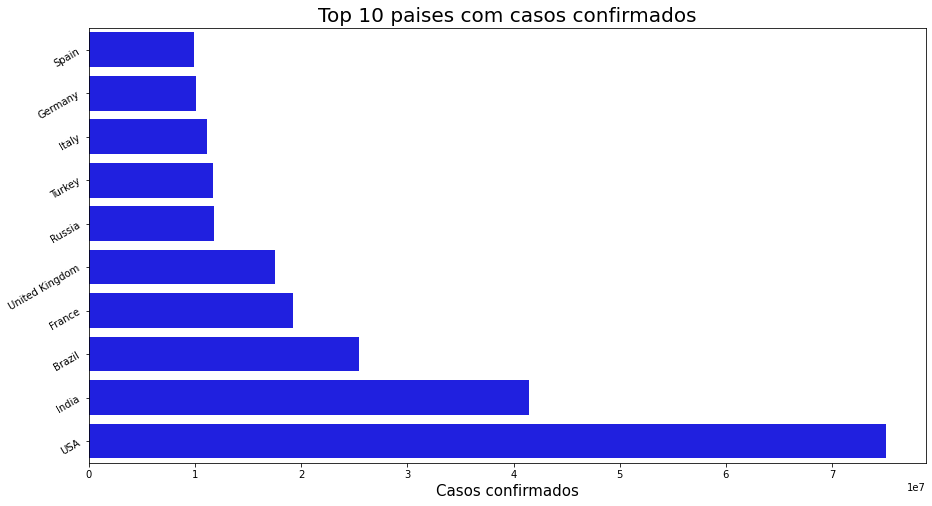

In [19]:
values = df_countries_cases.sort_values('Confirmed', ascending = True)["Confirmed"].values[-10:]
labels = df_countries_cases.sort_values('Confirmed', ascending = True)["Confirmed"].index[-10:]

plt.figure(figsize=(15,8))
sns.barplot(x = values, y=labels, color = "blue")

plt.xlabel("Casos confirmados", size = 15)
plt.ylabel("")
plt.yticks(rotation=30)
plt.title("Top 10 paises com casos confirmados", size = 20)   

plt.show()

### Top 10 paises em mortes confirmadas ao redor do mundo

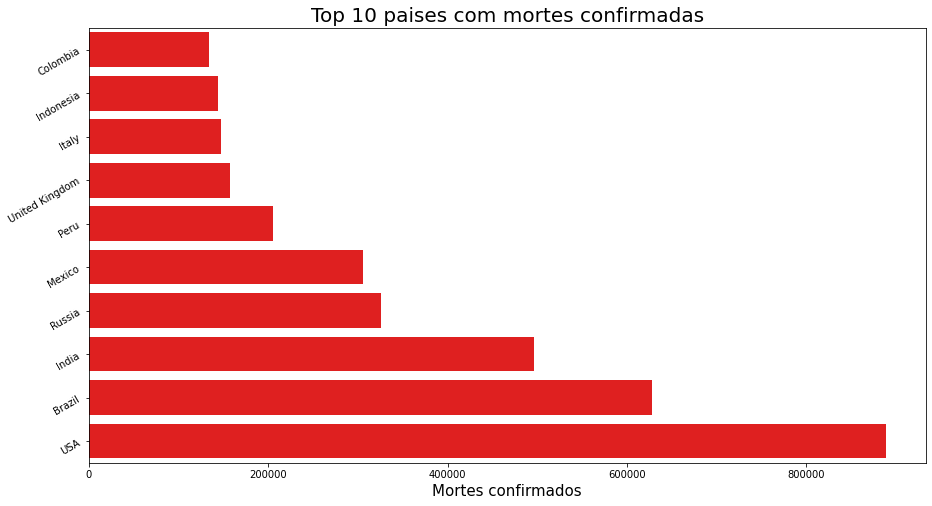

In [20]:
values = df_countries_cases.sort_values('Deaths', ascending = True)["Deaths"].values[-10:]
labels = df_countries_cases.sort_values('Deaths', ascending = True)["Deaths"].index[-10:]

plt.figure(figsize=(15,8))
sns.barplot(x = values, y=labels, color = "red")

plt.xlabel("Mortes confirmados", size = 15)
plt.ylabel("")
plt.yticks(rotation=30)
plt.title("Top 10 paises com mortes confirmadas", size = 20)   

plt.show()

## Visualização por mapa

### Vizualização por mapa dos casos confirmados ao redor do mundo

In [21]:
temp_df = pd.DataFrame(df_countries_cases['Confirmed'])
temp_df = temp_df.reset_index()

fig = px.choropleth(temp_df, 
                    locations= "Country",
                    color=np.log10(temp_df["Confirmed"]), # lifeExp is a column of gapminder
                    hover_name= "Country", # column to add to hover information
                    hover_data=["Confirmed"],
                    color_continuous_scale= 'matter',
                    locationmode="country names")

#fig.update_geos(fitbounds= "locations")
fig.update_layout(title_text="Casos confirmados - Mapa de calor (Log Scale)")
fig.update_coloraxes(colorbar_title="Casos confirmados (Log Scale)",colorscale = "Blues")
# fig.to_image("Global Heat Map confirmed.png")
fig.show()


### Vizualização por mapa das mortes confirmadas ao redor do mundo

In [22]:
temp_df = pd.DataFrame(df_countries_cases['Deaths'])
temp_df = temp_df.reset_index()

fig = px.choropleth(temp_df, 
                    locations= "Country",
                    color=np.log10(temp_df["Deaths"]+1), # lifeExp is a column of gapminder
                    hover_name="Country", # column to add to hover information
                    hover_data=["Deaths"],
                    color_continuous_scale=px.colors.sequential.Plasma,

                    locationmode="country names")

#fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(title_text="Mortes - Mapa de calor (Log Scale)")
fig.update_coloraxes(colorbar_title="Mortes (Log Scale)", colorscale="Reds")
# fig.to_image("Global Heat Map deaths.png")
fig.show()

### Evolução dos casos de covid ao redor do mundo

In [23]:
df_data = df_table.groupby(['Last_Update', 'Country'])['Confirmed', 'Deaths'].max().reset_index().fillna(0)
df_data["Last_Update"] = pd.to_datetime( df_data["Last_Update"]).dt.strftime('%m/%d/%Y')

fig = px.scatter_geo(df_data, 
                     locations="Country", 
                     locationmode= 'country names', 
                     color=np.power(df_data["Confirmed"], 0.3) -2 , 
                     size= np.power(df_data["Confirmed"]+ 2, 0.3) -1, 
                     hover_name="Country",
                     hover_data=["Confirmed"],
                     range_color= [0, max(np.power(df_data["Confirmed"], 0.3))], 
                     projection="natural earth", 
                     animation_frame="Last_Update", 
                     color_continuous_scale=px.colors.sequential.Plasma,
                     title='COVID-19: Progresso da pandemia')       
            
fig.update_coloraxes(colorscale="hot")
fig.update(layout_coloraxis_showscale=False)
fig.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



## Quantidade de casos e mortes confirmadas

In [24]:
  #Casos confirmados              
  trace1 = go.Scatter(x = dias_desde_1_22,
                    y = mm_diario,
                    name =  'Média movel {} dias'.format(tamanho),
                    line = {"dash":"dash"},
                    marker = dict(color = 'orange'))
  
  trace2 = go.Scatter(x = dias_desde_1_22,
                    y = total_confirmados,
                    mode = "lines",
                    name = 'Total de casos confirmados',
                    marker = dict(color = 'black'))
                          
  data = [trace1, trace2]
  layout = go.Layout(barmode = "group",
                   title = 'Casos confirmados de COVID-19 por dia',
                   yaxis = {"title": "Quantidade de casos confirmados"},
                  xaxis = {"title":"Dias desde 22/01/2020"})
  fig = go.Figure(data = data, layout = layout)
  py.iplot(fig)


#Casos confirmados              
  trace1 = go.Scatter(x = dias_desde_1_22,
                    y = mm_mortes,
                    name =  'Média movel {} dias'.format(tamanho),
                    line = {"dash":"dash"},
                    marker = dict(color = 'orange'))
  
  trace2 = go.Scatter(x = dias_desde_1_22,
                    y = total_mortos,
                    mode = "lines",
                    name = 'Mortes de COVID-19 em todo o mundo',
                    marker = dict(color = 'black'))
                          
  data = [trace1, trace2]
  layout = go.Layout(barmode = "group",
                   title = 'Mortes de COVID-19 em todo o mundos',
                   yaxis = {"title": "Quantidade de mortes confirmadas"},
                  xaxis = {"title":"Dias desde 22/01/2020"})
  fig = go.Figure(data = data, layout = layout)
  py.iplot(fig)


## Gráfico do logarimo, na base 10, da quantidade de confirmados e mortos em função do tempo

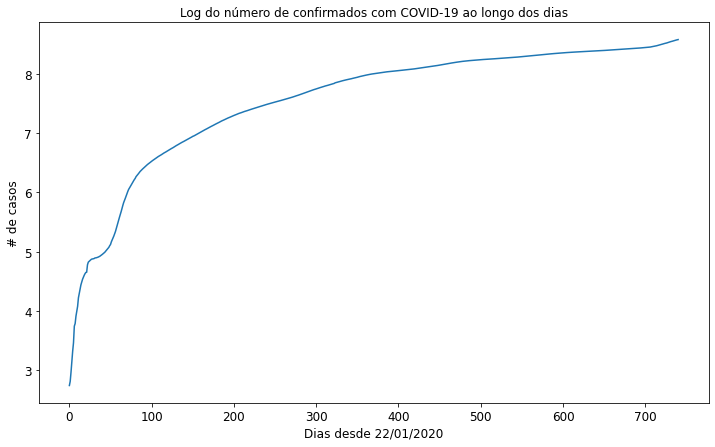

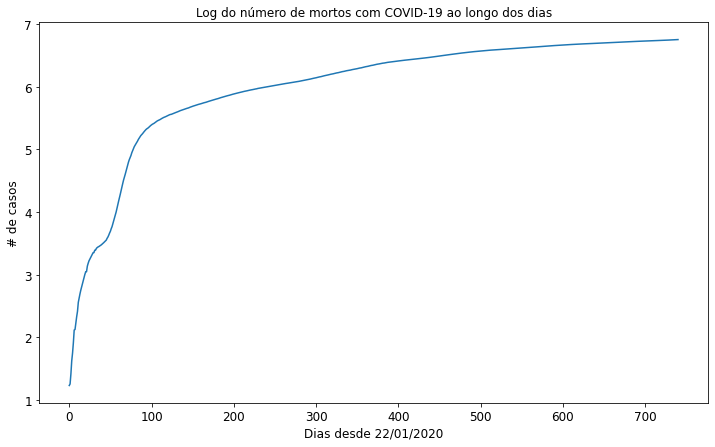

In [25]:
#Usando a biblioteca Matplotlib (diferenciando e utilizando outras bibliotacas)
plt.figure(figsize=(12,7))
plt.plot(dias_desde_1_22, np.log10(total_confirmados))
plt.title('Log do número de confirmados com COVID-19 ao longo dos dias', size=12)
plt.xlabel("Dias desde 22/01/2020", size=12)
plt.ylabel('# de casos', size=12)
plt.xticks(size=12)
plt.yticks(size=12)
plt.show()

plt.figure(figsize=(12,7))
plt.plot(dias_desde_1_22, np.log10(total_mortos))
plt.title('Log do número de mortos com COVID-19 ao longo dos dias', size=12)
plt.xlabel("Dias desde 22/01/2020", size=12)
plt.ylabel('# de casos', size=12)
plt.xticks(size=12)
plt.yticks(size=12)
plt.show()

## Aumento diario dos casos e mortes confirmadas no mundo

In [26]:
#Casos confirmados
trace1 = go.Scatter(
                    x = dias_desde_1_22,
                    y = m_casos_diario,
                    mode = "lines",
                    name = "MM7",
                    marker = dict(color = 'orange'))
                    
trace2 = go.Bar(x = dias_desde_1_22,
                y = a_diario_casos,
                name = "Casos diario",
                marker = dict(color = 'green'))
                            

data = [trace1, trace2]
layout = go.Layout(barmode = "group",
                   title = 'Casos de Coronavírus em todo o mundo',
                   yaxis = {"title": "Quantidade de casos confirmados"},
                  xaxis = {"title":"Dias desde o dia 22/01/2020"})
fig = go.Figure(data = data, layout = layout)
py.iplot(fig)

#Mortes confirmadas
trace1 = go.Scatter(
                    x = dias_desde_1_22,
                    y = m_mortes_diario,
                    mode = "lines",
                    name = "MM7",
                    marker = dict(color = 'red'))
                    
trace2 = go.Bar(x = dias_desde_1_22,
                y = a_diario_mortes,
                name = "Casos diario",
                marker = dict(color = 'blue'))
                              

data = [trace1, trace2]
layout = go.Layout(barmode = "group",
                   title = 'Mortes por COVID-19 em todo o mundo',
                   yaxis = {"title": "Quantidade de mortes confirmadas"},
                  xaxis = {"title":"Dias passados desde 22/01/2020"})
fig = go.Figure(data = data, layout = layout)
py.iplot(fig)


## Análise por países

Análise gráfica dos 6 paises mais populosos segundo o site: *World Population Prospects. 14 de abril de 2021. Consultado em 14 de abril de 2021*

("China", "India", "Estados Unidos", "Indonesia", "Paquistão" e "Brasil")

Aqui analisamos o total de casos confirmados, total de casos confirmados por dia e o total de mortes confirmados por dia para cada um destes paises. 



In [27]:
def plot_pais(x, y1, y2, y3, pais):
  confirmado_mm = media_movel(y1, tamanho)
  a_diario_mm = media_movel(y2, tamanho)
  mortes_mm = media_movel(y3, tamanho)


  #Casos confirmados              
  trace1 = go.Scatter(x = x,
                    y = confirmado_mm,
                    name = 'Média móvel {} dias'.format(tamanho),
                    line = {"dash":"dash"},
                    marker = dict(color = 'orange'))
  
  trace2 = go.Scatter(x = x,
                    y = y1,
                    mode = "lines",
                    name = '{} - Casos confirmados de COVID-19'.format(pais),
                    marker = dict(color = 'black'))
                          
  data = [trace1, trace2]
  layout = go.Layout(barmode = "group",
                   title = '{} - Casos confirmados de COVID-19'.format(pais),
                   yaxis = {"title": "Quantidade de casos confirmados"},
                  xaxis = {"title":"Dias desde 22/01/2020"})
  fig = go.Figure(data = data, layout = layout)
  py.iplot(fig)

  #Casos confirmados por dia
  trace1 = go.Scatter(
                    x = x,
                    y = a_diario_mm,
                    line = {"dash":"dash"},
                    mode = "lines",
                    name = 'Média móvel {} dias'.format(tamanho),
                    marker = dict(color = 'orange'))
                    
  trace2 = go.Bar(x = x,
                y = y2,
                name = '{} - Aumento diário de casos por COVID-19'.format(pais),
                marker = dict(color = 'green'))
                            
  data = [trace1, trace2]
  layout = go.Layout(barmode = "group",
                   title = '{} - Casos confirmados de COVID-19'.format(pais),
                   yaxis = {"title": "Quantidade de casos confirmados por dia"},
                  xaxis = {"title":"Dias desde 22/01/2020"})
  fig = go.Figure(data = data, layout = layout)
  py.iplot(fig)


  #Mortes confirmadas por dia
  trace1 = go.Scatter(
                    x = x,
                    y = mortes_mm,
                    line = {"dash":"dash"},
                    mode = "lines",
                    name = 'Média móvel {} dias'.format(tamanho),
                    marker = dict(color = 'orange'))
                    
  trace2 = go.Bar(x = x,
                y = y3,
                name = '{} - Aumento diário de mortes por COVID-19'.format(pais),
                marker = dict(color = 'red'))
                            
  data = [trace1, trace2]
  layout = go.Layout(barmode = "group",
                   title = '{} - Aumento diário de mortes por COVID-19'.format(pais),
                   yaxis = {"title": "Quantidade de mortes confirmadas por dia"},
                  xaxis = {"title":"Dias desde 22/01/2020"})
  fig = go.Figure(data = data, layout = layout)
  py.iplot(fig)

#função auxiliar para obter casos, mortes         
def informacao_pais(pais_nome):
    pais_casos = []
    pais_mortes = []

    for i in date:
        pais_casos.append(df_confirmados[df_confirmados['Country'] == pais_nome][i].sum())
        pais_mortes.append(df_mortos[df_mortos['Country']== pais_nome][i].sum())
        
    return (pais_casos, pais_mortes)
      
def visualizacao(pais_nome):
    informacao = informacao_pais(pais_nome)
    casos = informacao[0]
    mortes = informacao[1]
    
    pais_casos_confirmado = aumento_diario(casos)
    pais_mortes_confirmado = aumento_diario(mortes)
    
    plot_pais(dias_desde_1_22, casos, pais_casos_confirmado, pais_mortes_confirmado, pais_nome)


In [32]:
paises = ["China", "India", "USA", "Indonesia", "Pakistan", "Brazil"]

for i in paises:
  visualizacao(i)

Análise gráfica de outros paises.

In [29]:
def plot_pais(x, y1, y2, y3, pais):
  confirmado_mm = media_movel(y1, tamanho)
  a_diario_mm = media_movel(y2, tamanho)
  mortes_mm = media_movel(y3, tamanho)


  #Casos confirmados              
  trace1 = go.Scatter(x = x,
                    y = confirmado_mm,
                    name = 'Média móvel {} dias'.format(tamanho),
                    line = {"dash":"dash"},
                    marker = dict(color = 'orange'))
  
  trace2 = go.Scatter(x = x,
                    y = y1,
                    mode = "lines",
                    name = '{} - Casos confirmados de COVID-19'.format(pais),
                    marker = dict(color = 'black'))
                          
  data = [trace1, trace2]
  layout = go.Layout(barmode = "group",
                   title = '{} - Casos confirmados de COVID-19'.format(pais),
                   yaxis = {"title": "Quantidade de casos confirmados"},
                  xaxis = {"title":"Dias desde 22/01/2020"})
  fig = go.Figure(data = data, layout = layout)
  py.iplot(fig)

  #Casos confirmados por dia
  trace1 = go.Scatter(
                    x = x,
                    y = a_diario_mm,
                    line = {"dash":"dash"},
                    mode = "lines",
                    name = 'Média móvel {} dias'.format(tamanho),
                    marker = dict(color = 'orange'))
                    
  trace2 = go.Bar(x = x,
                y = y2,
                name = '{} - Aumento diário de casos por COVID-19'.format(pais),
                marker = dict(color = 'green'))
                            
  data = [trace1, trace2]
  layout = go.Layout(barmode = "group",
                   title = '{} - Casos confirmados de COVID-19'.format(pais),
                   yaxis = {"title": "Quantidade de casos confirmados por dia"},
                  xaxis = {"title":"Dias desde 22/01/2020"})
  fig = go.Figure(data = data, layout = layout)
  py.iplot(fig)


  #Mortes confirmadas por dia
  trace1 = go.Scatter(
                    x = x,
                    y = mortes_mm,
                    line = {"dash":"dash"},
                    mode = "lines",
                    name = 'Média móvel {} dias'.format(tamanho),
                    marker = dict(color = 'orange'))
                    
  trace2 = go.Bar(x = x,
                y = y3,
                name = '{} - Aumento diário de mortes por COVID-19'.format(pais),
                marker = dict(color = 'red'))
                            
  data = [trace1, trace2]
  layout = go.Layout(barmode = "group",
                   title = '{} - Aumento diário de mortes por COVID-19'.format(pais),
                   yaxis = {"title": "Quantidade de mortes confirmadas por dia"},
                  xaxis = {"title":"Dias desde 22/01/2020"})
  fig = go.Figure(data = data, layout = layout)
  py.iplot(fig)

#função auxiliar para obter casos, mortes         
def informacao_pais(pais_nome):
    pais_casos = []
    pais_mortes = []

    for i in date:
        pais_casos.append(df_confirmados[df_confirmados['Country'] == pais_nome][i].sum())
        pais_mortes.append(df_mortos[df_mortos['Country']== pais_nome][i].sum())
        
    return (pais_casos, pais_mortes)
      
def visualizacao(pais_nome):
    informacao = informacao_pais(pais_nome)
    casos = informacao[0]
    mortes = informacao[1]
    
    pais_casos_confirmado = aumento_diario(casos)
    pais_mortes_confirmado = aumento_diario(mortes)
    
    plot_pais(dias_desde_1_22, casos, pais_casos_confirmado, pais_mortes_confirmado, pais_nome)

In [30]:
paises = ['Russia', 'South Africa', 'Italy','Germany', 'Spain', 'France', 'United Kingdom', 'Peru', 'Mexico', 'Colombia', 'Argentina', 'Saudi Arabia', 'Iran', 'Bangladesh',
            'Turkey', 'Philippines', 'Iraq', 'Israel', 'Ukraine', 'Ecuador', 'Bolivia', 'Netherlands', 'Belgium', 'Poland', 'Czechia', 'Switzerland',
            'Romania', 'Morocco','Portugal', 'Austria', 'Sweden'] 

for i in paises:
  visualizacao(i)

### Comparando alguns paises

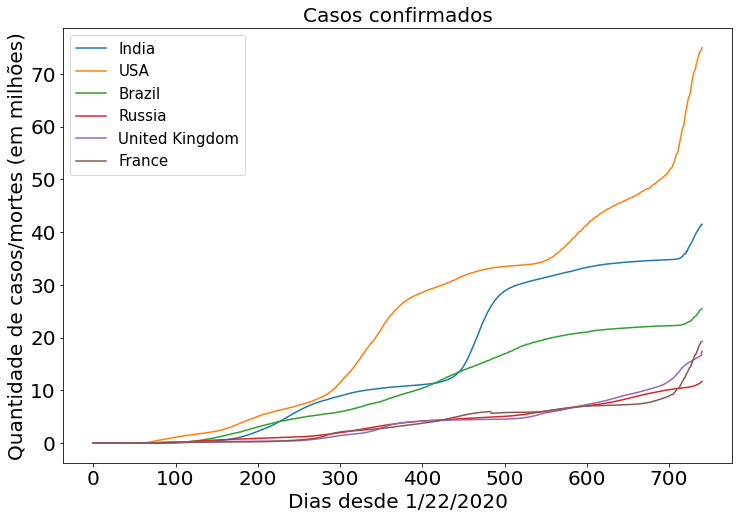

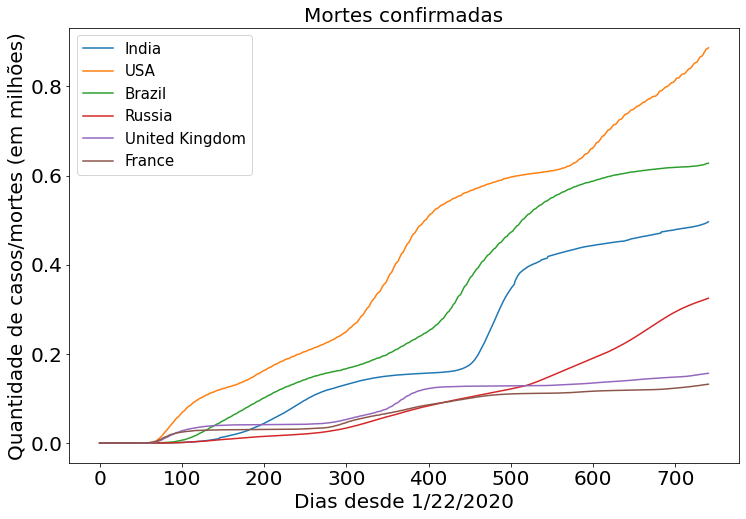

In [31]:
compare_countries = ['India', 'USA', 'Brazil', 'Russia', 'United Kingdom', 'France'] 
graph_name = ['Casos confirmados', 'Mortes confirmadas']

for num in range(2):
    plt.figure(figsize=(12, 8))
    for country in compare_countries:
        myList = informacao_pais(country)[num]
        myInt = 1000000
        newList = [float(i) / myInt for i in myList]
        plt.plot(newList)
    plt.legend(compare_countries, prop={'size': 15})
    plt.xlabel('Dias desde 1/22/2020', size=20)
    plt.ylabel('Quantidade de casos/mortes (em milhões)', size=20)
    plt.title(graph_name[num], size=20)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()